# Gull Tracking

The [Research Institute for Nature and Forest (INBO)](https://www.inbo.be/en) has been monitoring GPS locations of herring gulls breeding at the North Sea coast of Belgium since 2013. For 2018, there are 2.4 million bird-tracking coordinates, which are difficult to visualize with most plotting libraries but are easily visualized using [Datashader](https://datashader.org). See [DOI 10.5281/zenodo.3541812](https://zenodo.org/record/3541812) for details and how to download the data.

In [1]:
import pandas as pd
import hvplot.pandas # noqa
from holoviews.util.transform import lon_lat_to_easting_northing as ll_en

The CSV file contains latitude and longitude information in degrees. Here we will want to overlay this data onto geographic mapping tiles that use the [Web Mercator projection](https://en.wikipedia.org/wiki/Web_Mercator_projection), so we use a utility from HoloViews to project the spherical coordinates into the tiles' coordinate system to allow them to be overlaid correctly.

We will also center the plot on where most of the data is concentrated by plotting within selected longitude and latitude locations.

In [2]:
df = pd.read_csv('./data/HG_OOSTENDE-gps-2018.csv', usecols=['location-long', 'location-lat'])
df['easting'], df['northing'] = ll_en(df['location-long'], df['location-lat'])

df = df[(df['location-long'] > -14) & (df['location-lat'] < 53.3)]

print(df.head())
print(f"Length of data: {len(df)}")

   location-long  location-lat        easting      northing
0       2.819559     50.978461  313871.827614  6.617485e+06
1       2.819568     50.978458  313872.885149  6.617484e+06
2       2.819568     50.978466  313872.918545  6.617486e+06
3       2.819576     50.978476  313873.797969  6.617487e+06
4       2.819571     50.978457  313873.219107  6.617484e+06
Length of data: 2432290


In [3]:
df.hvplot.points(x='easting', y='northing', rasterize=True, tiles='EsriImagery',
                 cmap='fire', cnorm='eq_hist', dynspread=True, width=800, height=800)

/home/runner/work/examples/examples/gull_tracking/envs/default/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [easting,northing]   (easting_northing Count)

If you have a live Python process running, you should be able to select the wheel-zoom tool widget and then zoom into the above image and have it re-render the data at the new location, revealing more detail as you zoom in.  For instance, here's a large-scale region followed by a zoomed-in area, indicating that these gulls tend to spend a lot of time around certain man-made features of the landscape:

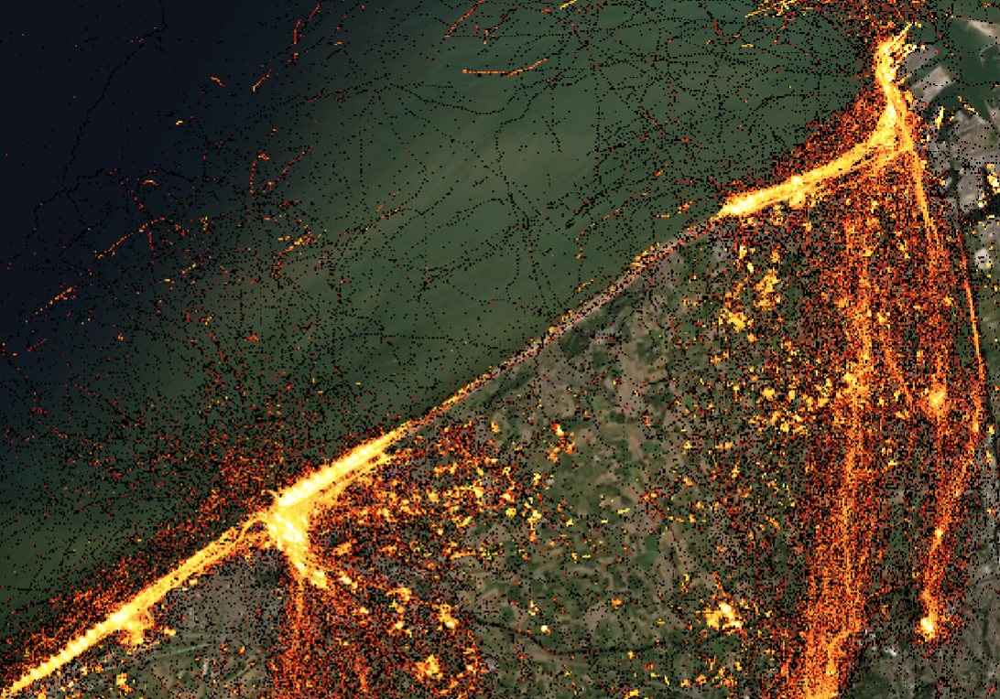


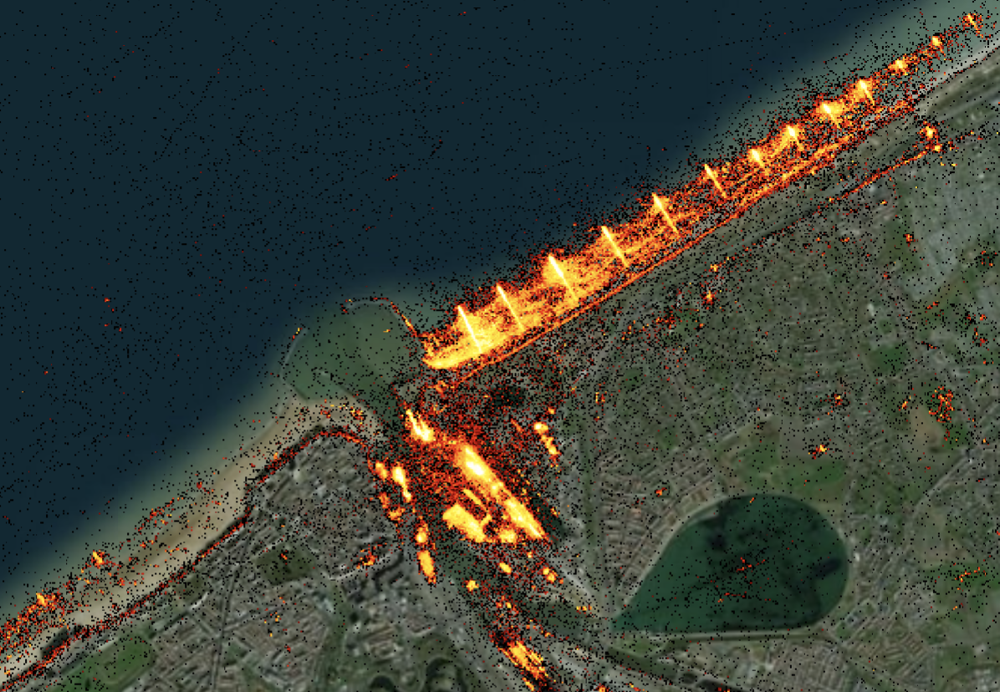
